In [1]:
import numpy as np
import cupy as cp
import cupyx.scipy.signal as signal
import scipy
import pandas as pd

import matplotlib.pyplot as plt
import plotly.tools as tls
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots


import datetime
import pickle
import importlib
import json
import time
import glob

from eve_part.data.constant import wavelength_list_eve
from eve_part.gaussian_fit_eve import gaussian_fit_eve



import sunpy.map
import sunpy.visualization.colormaps as cm
import sunpy.sun.constants
from sunpy.map.maputils import all_coordinates_from_map, coordinate_is_on_solar_disk
from aiapy.calibrate import register, update_pointing,normalize_exposure

from astropy.constants import G, M_sun, R_sun, au
from astropy.time import Time
from astropy.coordinates import get_body_barycentric_posvel
from astropy.units import imperial
from astropy.modeling import models, fitting
import astropy.units as u
from astropy import constants as const
from astropy.stats import gaussian_sigma_to_fwhm

import scipy
from scipy import signal
from scipy.fft import fftshift
from scipy import ndimage

import math
from math import pi
import glob
import time
import datetime
import os
import importlib
import warnings

from PIL import Image
from fpdf import FPDF

import aia_part
from aia_part.pixel_to_world.std_pixel_to_world import std_pixel_to_world
from aia_part.pixel_to_world.my_pixel_to_world import my_pixel_to_world
from aia_part.calculate_DN import calculate_DN
from aia_part.gaussian_fit_aia import gaussian_fit_aia
from aia_part.data.constant import wavelength_list_aia_absolute

# 3D irradiance

## EVE

In [2]:
def get_eve_data(start_date,end_date):
    daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
    daily_fit_df=daily_fit_df.set_index('time')
    daily_fit_df.index = pd.to_datetime(daily_fit_df.index)
    
    selected_df = daily_fit_df.loc[start_date:end_date]
    irradiance=[]
    selected_time_list=selected_df.index
    for date in selected_time_list:
        func=models.Gaussian1D(amplitude=daily_fit_df.loc[date,'median_of_amplitude'],
                  mean=daily_fit_df.loc[date,'median_of_mean'], 
                  stddev=daily_fit_df.loc[date,'median_of_stddev'])
        irradiance.append(func(wavelength_list_eve))
    return selected_time_list,irradiance

def plotly_3d_eve(date_list,irradiance_list):
        # Generate x and y coordinates for the surface plot
    x = np.arange(np.shape(irradiance_list)[1])
    y = np.arange(np.shape(irradiance_list)[0])
    X, Y = np.meshgrid(x, y)

    # Create the surface plot
    fig = go.Figure(data=[go.Surface(x=X,y=Y,z=irradiance_list )])

    # Customize the layout
    fig.update_layout(
        title='3D Surface Plot',
        # width=550, 
        height=700,
        scene=dict(
            xaxis=dict(
                title='wavelength (nm)',
                ticktext=wavelength_list_aia_absolute[::2],  # Set the desired tick labels
                tickvals=x[::2],  # Use the x coordinates as tick values
            ),
            yaxis=dict(title='Time (10s)',
                       ticktext=date_list[::len(date_list)//5],
                      tickvals=y[::len(y)//5]),
            zaxis=dict(title='Irradiance')
        ),
        # margin=dict(l=0,r=20)
    )
    fig.show()
    
def plot_3d_eve(start_date,end_date):
    '''
    3d surface
    time 
    '''
    date_list,irradiance_list=get_eve_data(start_date,end_date)
    plotly_3d_eve(date_list,irradiance_list)

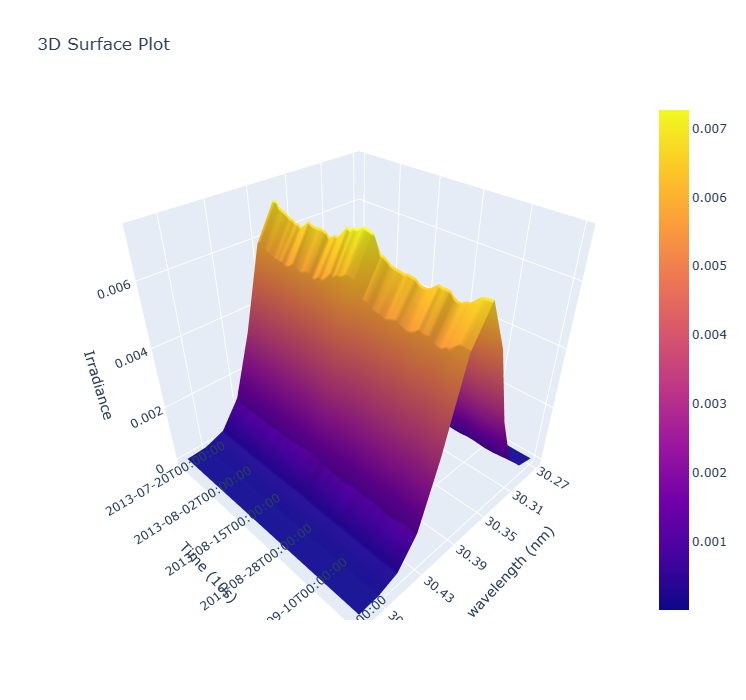

In [3]:
start_date = datetime.datetime(2013, 7, 20)
end_date = datetime.datetime(2013, 9, 23)
# original_df.index
plot_3d_eve(start_date,end_date)

## AIA

In [4]:
def select_files(start_date,end_date):
    # Directory containing the files
    directory = "aia_part/data/AIA_1p5"

    # List to store the files within the time range
    files_within_range = []

    # Iterate through all the files in the directory
    for filename in os.listdir(directory):
        # Extract the date portion from the file name
        date_str = filename.split("_")[3]+filename.split("_")[4]+filename.split("_")[5].split('t')[0]  # Assuming the date is in the 5th position

        # Convert the date string to a datetime object
        file_date = datetime.datetime.strptime(date_str, "%Y%m%d")

        # Check if the file date is within the specified range
        if start_date <= file_date <= end_date:
            files_within_range.append(
                os.path.join(directory,filename)
                                    )
    return files_within_range

def calculate(selected_files,a,d,e):
    irradiance_list=[]
    date_list=[]
    aia_adjusted_maps=sunpy.map.Map(selected_files)
    for m in aia_adjusted_maps:
        date,irradiance=calculate_DN(m,a=a,d=d,e=e)
        
        irradiance_list.append(irradiance)
        date_list.append(date)
    irradiance_list=np.array(irradiance_list)
    return date_list,irradiance_list

def plotly_3d_aia(date_list,irradiance_list):
        # Generate x and y coordinates for the surface plot
    x = np.arange(np.shape(irradiance_list)[1])
    y = np.arange(np.shape(irradiance_list)[0])
    X, Y = np.meshgrid(x, y)

    # Create the surface plot
    fig = go.Figure(data=[go.Surface(x=X,y=Y,z=irradiance_list )])

    # Customize the layout
    fig.update_layout(
        title='3D Surface Plot',
        # width=550, 
        height=700,
        scene=dict(
            xaxis=dict(
                title='wavelength (nm)',
                ticktext=wavelength_list_aia_absolute[::2],  # Set the desired tick labels
                tickvals=x[::2],  # Use the x coordinates as tick values
            ),
            yaxis=dict(title='Time (10s)',
                       ticktext=date_list[::len(date_list)//5],
                      tickvals=y[::len(y)//5]),
            zaxis=dict(title='Irradiance')
        ),
        # margin=dict(l=0,r=20)
    )
    fig.show()
    
def plot_3d_aia(start_date,end_date,a=0,d=0,e=0):
    selected_files=select_files(start_date,end_date)
    date_list,irradiance_list=calculate(selected_files,a=a,d=d,e=e)
    plotly_3d_aia(date_list,irradiance_list)

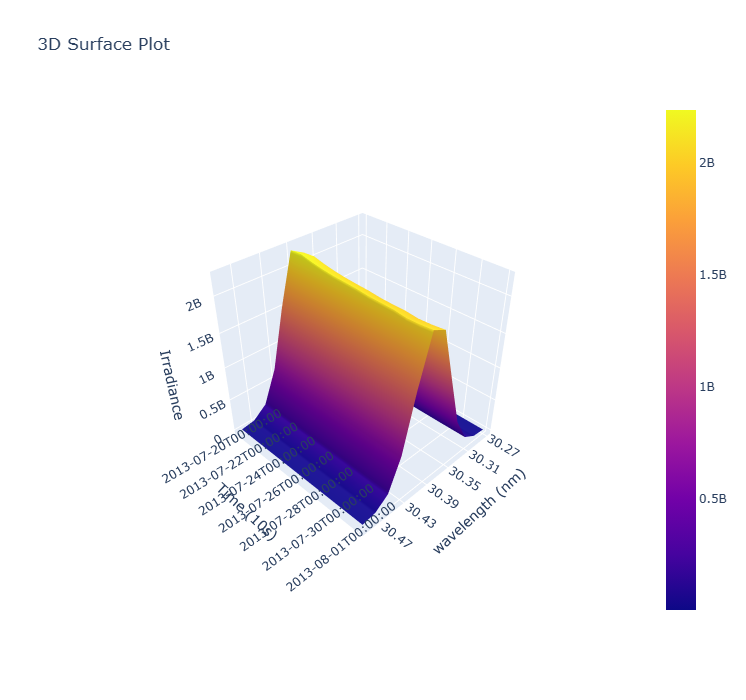

In [5]:
start_date = datetime.datetime(2013, 7, 20)
end_date = datetime.datetime(2013, 8, 1)
plot_3d_aia(start_date,end_date,a=800,d=0.9,e=0)

## combine

In [14]:
def get_eve_data(start_date,end_date):
    daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
    daily_fit_df=daily_fit_df.set_index('time')
    daily_fit_df.index = pd.to_datetime(daily_fit_df.index)
    
    selected_df = daily_fit_df.loc[start_date:end_date]
    irradiance=[]
    selected_time_list=selected_df.index
    for date in selected_time_list:
        func=models.Gaussian1D(amplitude=daily_fit_df.loc[date,'median_of_amplitude'],
                  mean=daily_fit_df.loc[date,'median_of_mean'], 
                  stddev=daily_fit_df.loc[date,'median_of_stddev'])
        irradiance.append(func(wavelength_list_eve))
    return selected_time_list,irradiance

def select_files(start_date,end_date):
    # Directory containing the files
    directory = "aia_part/data/AIA_1p5"

    # List to store the files within the time range
    files_within_range = []

    # Iterate through all the files in the directory
    for filename in os.listdir(directory):
        # Extract the date portion from the file name
        date_str = filename.split("_")[3]+filename.split("_")[4]+filename.split("_")[5].split('t')[0]  # Assuming the date is in the 5th position

        # Convert the date string to a datetime object
        file_date = datetime.datetime.strptime(date_str, "%Y%m%d")

        # Check if the file date is within the specified range
        if start_date <= file_date <= end_date:
            files_within_range.append(
                os.path.join(directory,filename)
                                    )
    return files_within_range

def calculate(selected_files,a,d,e):
    irradiance_list=[]
    date_list=[]
    aia_adjusted_maps=sunpy.map.Map(selected_files)
    for m in aia_adjusted_maps:
        date,irradiance=calculate_DN(m,a=a,d=d,e=e)
        
        irradiance_list.append(irradiance)
        date_list.append(date)
    irradiance_list=np.array(irradiance_list)
    return date_list,irradiance_list






def plotly_3d_combine(date_list,aia_irradiance_list,eve_irradiance_list):
        # Generate x and y coordinates for the surface plot
    x = np.arange(np.shape(aia_irradiance_list)[1])
    y = np.arange(np.shape(aia_irradiance_list)[0])
    X, Y = np.meshgrid(x, y)

    
    surface_aia=go.Surface(x=X,y=Y,z=aia_irradiance_list/np.average(aia_irradiance_list) )
    surface_eve=go.Surface(x=X,y=Y,z=eve_irradiance_list/np.average(eve_irradiance_list) )
    
    # Create the first surface trace with a specific color
    surface_aia = go.Surface(x=X, y=Y, z=aia_irradiance_list/np.average(aia_irradiance_list)
                             , name='AIA Irradiance', 
                             colorscale='Blues'
                            )

    # Create the second surface trace with a different cmap
    surface_eve = go.Surface(x=X, y=Y, z=eve_irradiance_list/np.average(eve_irradiance_list)
                             , name='EVE Irradiance', 
                             colorscale='Reds',
                             # colorbar=dict(xanchor='right', colorbar_x=-0.5)
                            )

    # Create the surface plot
    fig = go.Figure(data=[surface_aia,surface_eve])

    # Customize the layout
    fig.update_layout(
        title='EVE obs and AIA simu',
        # width=550, 
        height=700,
        scene=dict(
            xaxis=dict(
                title='wavelength (nm)',
                ticktext=wavelength_list_eve[::2],  # Set the desired tick labels
                tickvals=x[::2],  # Use the x coordinates as tick values
            ),
            yaxis=dict(title='Time ',
                       ticktext=date_list[::len(date_list)//3],
                      tickvals=y[::len(y)//3]),
            zaxis=dict(title='Irradiance')
        ),
        # margin=dict(l=0,r=20)
    )
    fig.show()
    fig.write_html('combine_3d.html')

In [15]:
def plot_3d_combine(start_date,end_date,a,d,e):
    aia_selected_files=select_files(start_date,end_date)
    aia_date_list,aia_irradiance_list=calculate(aia_selected_files,a,d,e)
    
    eve_date_list,eve_irradiance_list=get_eve_data(start_date,end_date)
    plotly_3d_combine(eve_date_list,aia_irradiance_list,eve_irradiance_list)
    

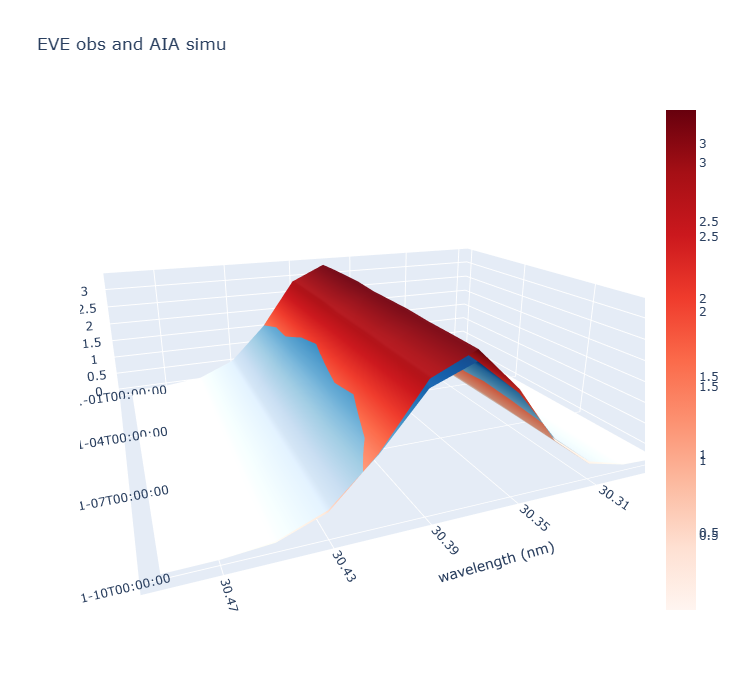

In [16]:
start_date = datetime.datetime(2011, 1, 1)
end_date = datetime.datetime(2011, 1, 10)
plot_3d_combine(start_date,end_date,a=900,d=0.9,e=-0.01)

In [ ]:
daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
daily_fit_df=daily_fit_df.set_index('time')
daily_fit_df.index = pd.to_datetime(daily_fit_df.index)

selected_df = daily_fit_df.loc[start_date:end_date]

In [10]:
selected_df

,median_of_mean,median_of_stddev,median_of_amplitude,stddev_of_mean,stddev_of_stddev,stddev_of_amplitude,available_data
time,,,,,,,
2011-01-01,30.374072,0.028570,0.006388,0.000207,0.000079,0.000047,8584
2011-01-02,30.373920,0.028626,0.006433,0.000225,0.000065,0.000033,8515
2011-01-03,30.373777,0.028658,0.006447,0.000189,0.000090,0.000039,8584
2011-01-04,30.373643,0.028716,0.006454,0.000189,0.000059,0.000037,8583
2011-01-05,30.373532,0.028738,0.006373,0.000207,0.000060,0.000036,8583
2011-01-06,30.373523,0.028727,0.006375,0.000189,0.000061,0.000032,8583
2011-01-07,30.373558,0.028742,0.006377,0.000189,0.000062,0.000030,8583
2011-01-08,30.373655,0.028724,0.006318,0.000181,0.000064,0.000046,8583
2011-01-09,30.373827,0.028668,0.006304,0.000242,0.000077,0.000045,8515


In [11]:
from astropy.stats import gaussian_fwhm_to_sigma,gaussian_sigma_to_fwhm

In [12]:
0.03*gaussian_sigma_to_fwhm

0.07064460135092848

# 2D plot

## EVE

In [2]:
def select_df(start_date,end_date):
    daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
    daily_fit_df=daily_fit_df.set_index('time')
    daily_fit_df.index = pd.to_datetime(daily_fit_df.index)

    selected_df = daily_fit_df.loc[start_date:end_date]
    return selected_df

In [36]:
def plotly_2d_eve(selected_df):
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.011)

    valid_day=np.where(selected_df['available_data']>=np.nanmean(selected_df['available_data'])*0.2,1,np.nan)
    x = selected_df.index
    y_median = selected_df['median_of_mean']*valid_day
    y_stddev = selected_df['stddev_of_mean']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])

    # Plot the mean line
    fig.add_trace(go.Scatter(x=x, y=y_median,
                                  showlegend=False, 
                            line=dict(color='rgb(0,128,255)', )) ,
                  row=1, col=1,)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                  fill='tozerox', 
                                  fillcolor='rgba(0,176,246,0.2)',
                                  line=dict(color='rgba(127,255,0,0.2)'),
                                  showlegend=False, 
                                  name='3 Std. Dev.'),
                 row=1, col=1)

    fig.update_yaxes(title_text="Mean (nm)",range=[30.3705, 30.3755],row=1, col=1)
    # Show the plot



    # Create a figure for fwhm
    x = selected_df.index
    y_median = selected_df['median_of_fwhm']*valid_day
    y_stddev = selected_df['stddev_of_fwhm']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])

    fig.add_trace(go.Scatter(x=x, y=y_median,
                                # showlegend=False,
                             line=dict(color='rgb(0,128,255)'),),
                          row=2, col=1)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                  fill='tozerox', 
                                  fillcolor='rgba(0,176,246,0.2)',
                                  line=dict(color='rgba(127,255,0,0.2)'),
                                  # showlegend=False,
                                  name='3 Std. Dev.'),
                        row=2, col=1)

    fig.update_yaxes(title_text="FWHM (nm)",
                     range=[0.065, 0.076],
                     row=2, col=1)





    # # Create a figure for amplitude
    x = selected_df.index
    y_median = selected_df['median_of_amplitude']*valid_day
    y_stddev = selected_df['stddev_of_amplitude']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])


    fig.add_trace(go.Scatter(x=selected_df.index, y=y_median,
                                             # showlegend=False,
                            line=dict(color='rgb(0,128,255)'),),
                             row=3, col=1)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                  fill='tozerox', 
                                  fillcolor='rgba(0,176,246,0.2)',
                                  line=dict(color='rgba(127,255,0,0.2)'),
                                  # showlegend=False, 
                                  name='3 Std. Dev.'),
                           row=3, col=1)

    fig.update_yaxes(title_text='amplitude (nm)',range=[0.0059, 0.0082],row=3, col=1)
    fig.update_xaxes(title_text="Time",row=3, col=1)


    fig.update_layout(
        width=900,height=1400,
                          title_text="EVE: obs: Daily Median, Standard Deviation, Amplitude and Irradiance",
                         # legend=dict(x=1, y=0.9)
    ) 

    
    
    fig.write_html('eve_years_2d.html')
    fig.show()

In [37]:
def plot_2d_eve(start_date,end_date):
    selected_df=select_df(start_date,end_date)
    plotly_2d_eve(selected_df)

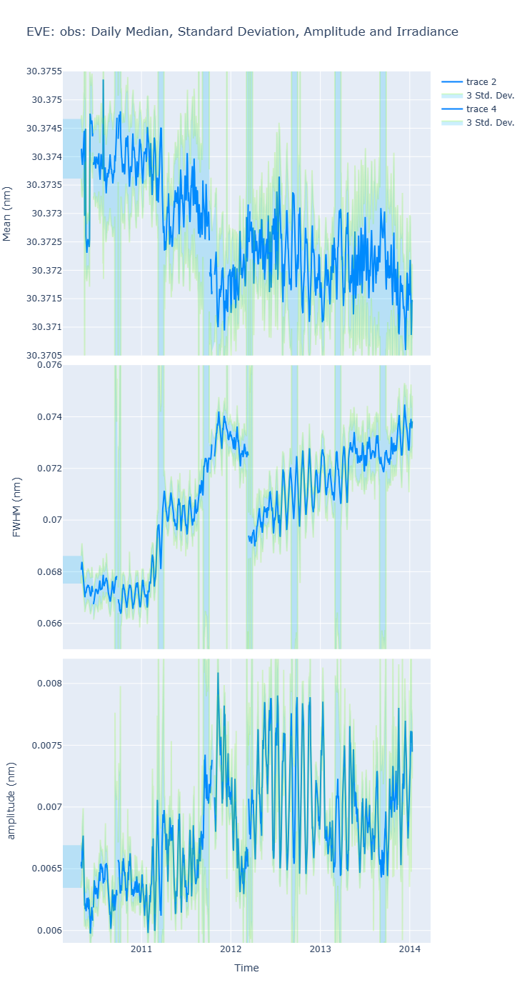

In [38]:
start_date = datetime.datetime(2010, 1, 1)
end_date = datetime.datetime(2014, 1, 11)
plot_2d_eve(start_date,end_date)

### Spectrogram : Gabor transform

In [4]:
def select_df(start_date,end_date):
    daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
    daily_fit_df=daily_fit_df.set_index('time')
    daily_fit_df.index = pd.to_datetime(daily_fit_df.index)

    selected_df = daily_fit_df.loc[start_date:end_date]
    return selected_df

In [5]:
start_date = datetime.datetime(2010, 1, 1)
end_date = datetime.datetime(2014, 1, 11)
selected_df=select_df(start_date,end_date)

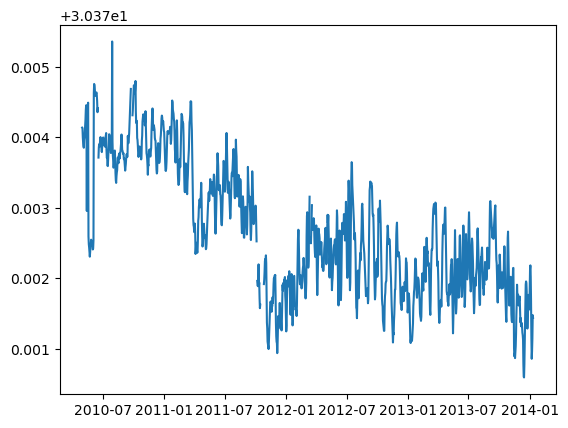

In [6]:
fig,ax=plt.subplots()
ax.plot(selected_df['median_of_mean'])

In [183]:
selected_df['median_of_amplitude']

time
2010-04-30    0.006518
2010-05-01    0.006556
2010-05-02    0.006503
2010-05-03    0.006513
2010-05-04    0.006656
                ...   
2014-01-07    0.007571
2014-01-08    0.007581
2014-01-09    0.007614
2014-01-10    0.007601
2014-01-11    0.007446
Name: median_of_amplitude, Length: 1353, dtype: float64

In [198]:
t

array([  30.,   83.,  136.,  189.,  242.,  295.,  348.,  401.,  454.,
        507.,  560.,  613.,  666.,  719.,  772.,  825.,  878.,  931.,
        984., 1037., 1090., 1143., 1196., 1249., 1302.])

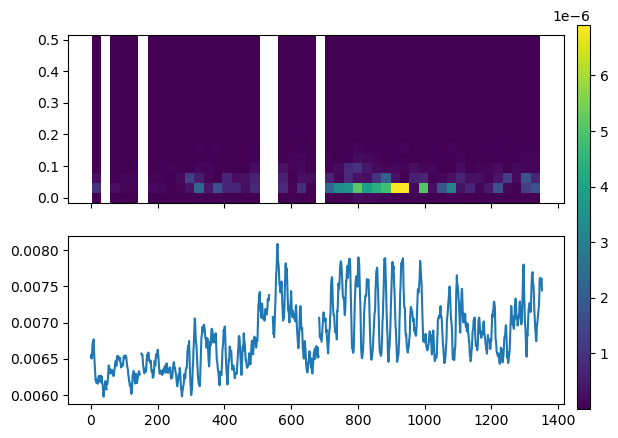

In [219]:
Gabor(selected_df['median_of_amplitude'].values)

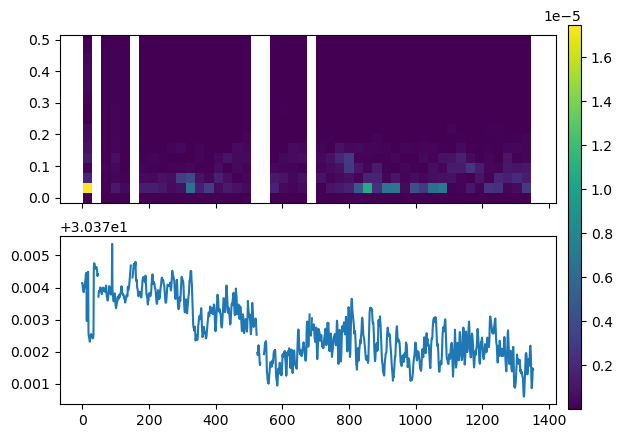

In [220]:
Gabor(selected_df['median_of_mean'].values)

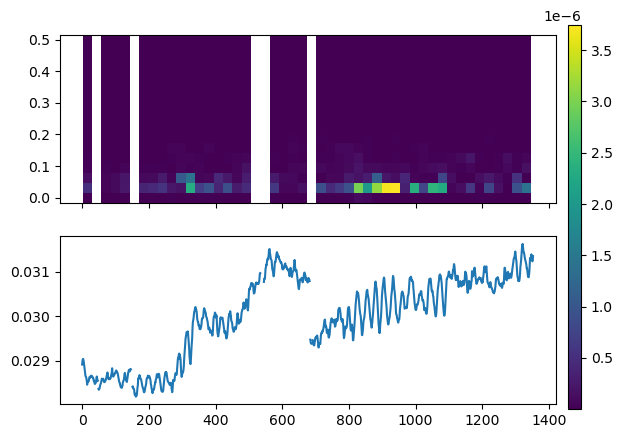

In [221]:
Gabor(selected_df['median_of_stddev'].values)

In [216]:
def Gabor(data):
    fig,axs=plt.subplots(ncols=1,nrows=2,sharex=True)
    cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    f, t, Sxx = signal.spectrogram(data,nperseg=32)

    sc=axs[0].pcolormesh(t, f, Sxx,
                   # shading='gouraud'
                  )

    axs[1].plot(data);
    plt.colorbar(sc,cax=cax)

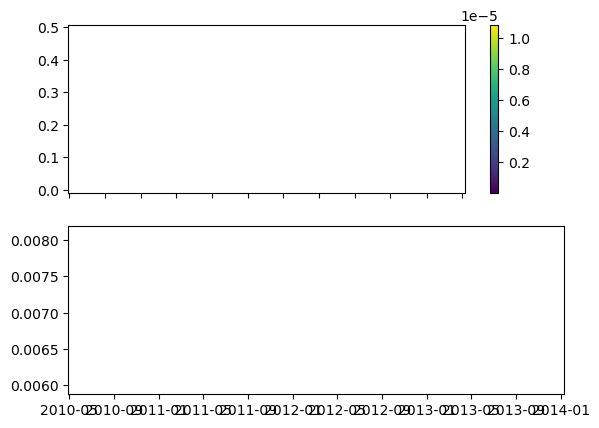

In [205]:
fig, axs = plt.subplots(ncols=1, nrows=2, sharex=True)
f, t, Sxx = signal.spectrogram(selected_df['median_of_amplitude'].values, nperseg=60)

sc = axs[0].pcolormesh(t, f, Sxx)

axs[1].plot(selected_df['median_of_amplitude'].values)

# Set the same x-axis limits for both axes
x_min, x_max = selected_df.index.min(), selected_df.index.max()
axs[0].set_xlim(x_min, x_max)
axs[1].set_xlim(x_min, x_max)

fig.colorbar(sc)

plt.show()

In [146]:
f, t, Sxx = signal.spectrogram(x)
t

array([128., 352.])

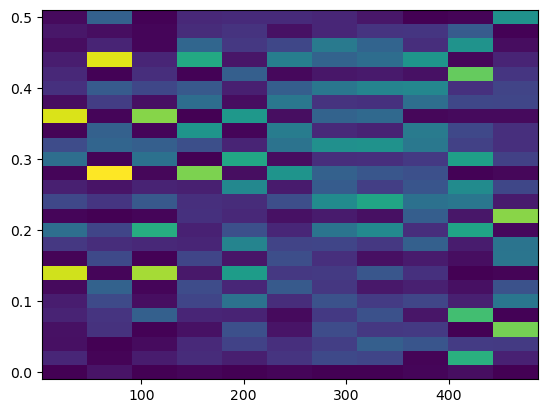

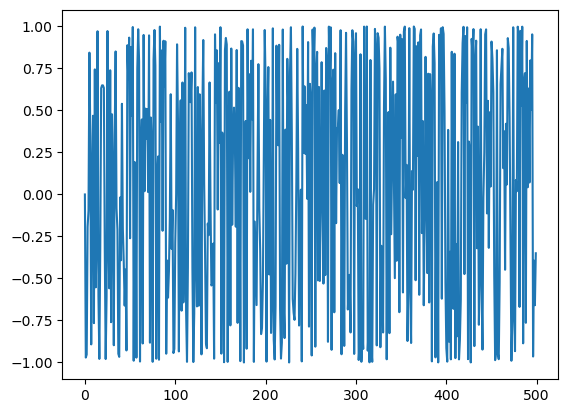

In [178]:
t=np.linspace(0,1e3,500)
x=np.sin(2*np.pi*18*t+t**2)

f, t, Sxx = signal.spectrogram(x,nperseg=50)
fig,ax=plt.subplots()
ax.pcolormesh(t, f, Sxx,
               # shading='gouraud'
              )
fig,ax=plt.subplots()
ax.plot(x);

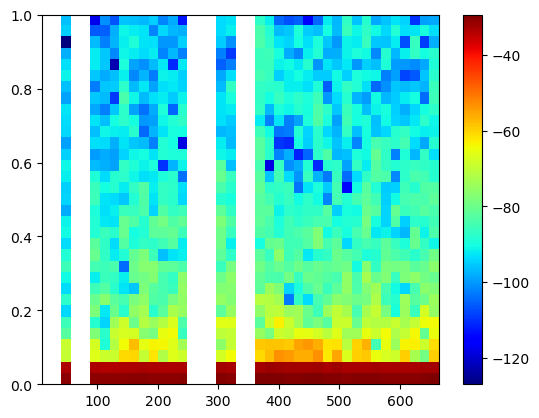

In [15]:
fig, ax = plt.subplots()
Pxx, freqs, bins, im = ax.specgram(selected_df['median_of_amplitude'], NFFT=64, noverlap=32, cmap='jet')
plt.colorbar(im, ax=ax)

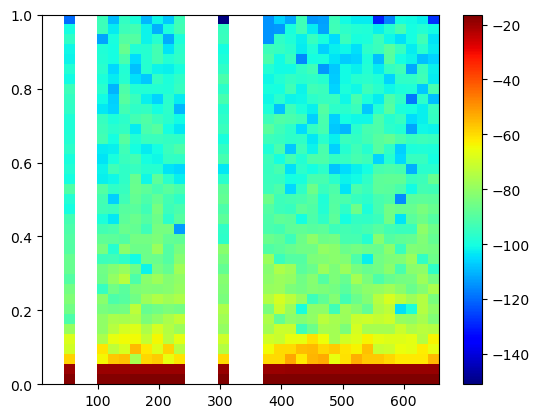

In [113]:
fig, ax = plt.subplots()
Pxx, freqs, bins, im = ax.specgram(selected_df['median_of_stddev'], NFFT=72, noverlap=36, cmap='jet')
plt.colorbar(im, ax=ax)ss

In [ ]:
### Wavelet Transform

### EVE correlation

In [74]:
# start_date = datetime.datetime(2010, 6, 1)
# end_date = datetime.datetime(2014, 6, 1)
start_date = datetime.datetime(2012, 6, 1)
end_date = datetime.datetime(2013, 1, 1)
selected_df=select_df(start_date,end_date)

In [75]:
selected_df

,median_of_mean,median_of_stddev,median_of_amplitude,stddev_of_mean,stddev_of_stddev,stddev_of_amplitude,available_data
time,,,,,,,
2012-06-01,30.372699,0.029928,0.007254,0.000180,0.000080,0.000099,8581
2012-06-02,30.372965,0.029884,0.007471,0.000227,0.000080,0.000058,8581
2012-06-03,30.372869,0.029899,0.007577,0.000351,0.000076,0.000100,8513
2012-06-04,30.372459,0.029904,0.007577,0.000354,0.000098,0.000050,8582
2012-06-05,30.372006,0.029975,0.007691,0.000329,0.000097,0.000098,8580
...,...,...,...,...,...,...,...
2012-12-28,30.372227,0.030179,0.006863,0.000231,0.000106,0.000040,7863
2012-12-29,30.372070,0.030222,0.006817,0.000227,0.000114,0.000043,8583
2012-12-30,30.371758,0.030292,0.006849,0.000280,0.000116,0.000044,8154


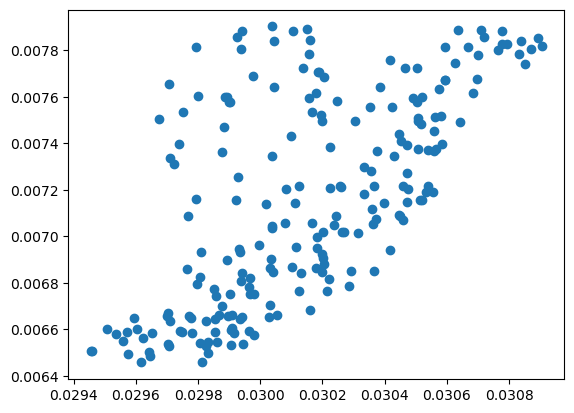

In [76]:
fig,ax=plt.subplots()
ax.scatter(selected_df['median_of_stddev'],selected_df['median_of_amplitude'])

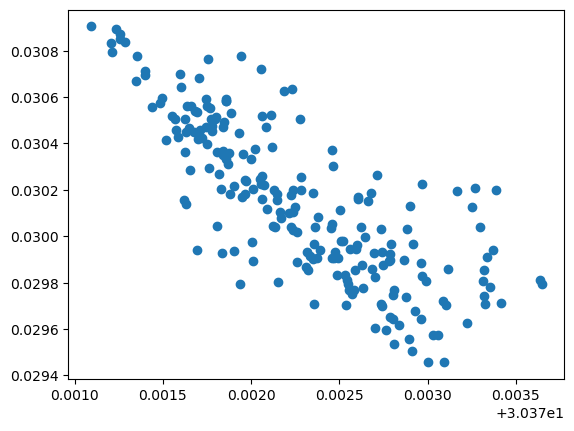

In [77]:
fig,ax=plt.subplots()
ax.scatter(selected_df['median_of_mean'],selected_df['median_of_stddev'])

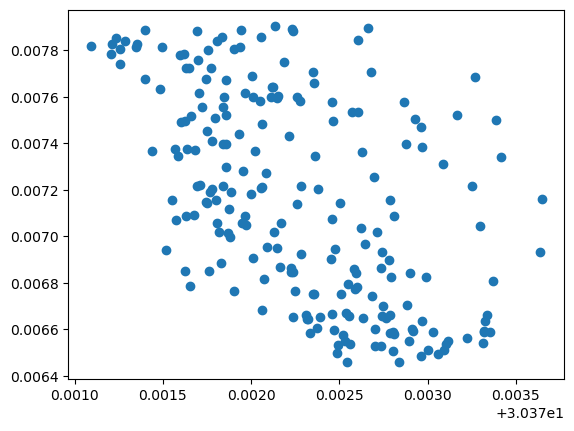

In [78]:
fig,ax=plt.subplots()
ax.scatter(selected_df['median_of_mean'],selected_df['median_of_amplitude'])

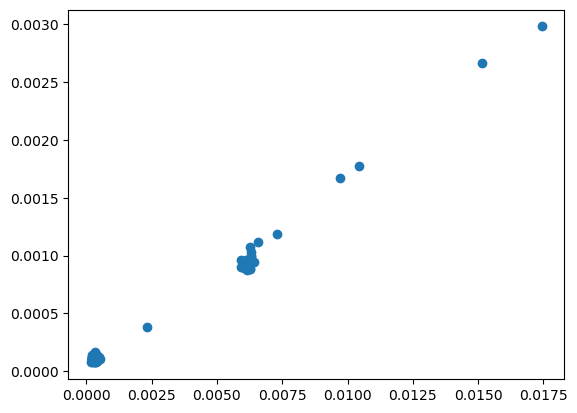

In [79]:
fig,ax=plt.subplots()
ax.scatter(selected_df['stddev_of_mean'],selected_df['stddev_of_stddev'])

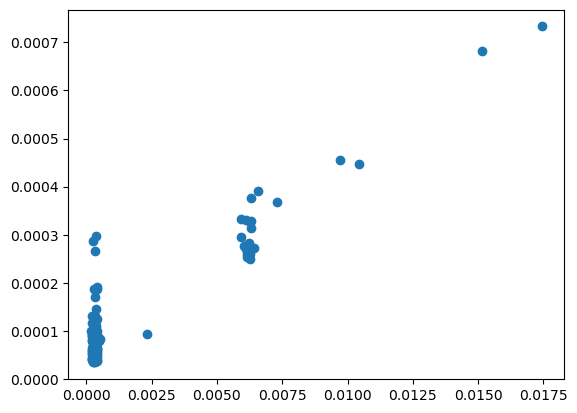

In [80]:
fig,ax=plt.subplots()
ax.scatter(selected_df['stddev_of_mean'],selected_df['stddev_of_amplitude'])

In [81]:
x = np.array([1, 2, 3, 4, 5]).reshape(-1, 1)
x

array([[1],
       [2],
       [3],
       [4],
       [5]])

In [82]:
def regression(str1,str2):
    regr = linear_model.LinearRegression()
    x=selected_df[str1].values.reshape(-1, 1)
    y=selected_df[str2].values
    # Train the model using the training sets
    regr.fit(x,y)

    # Make predictions using the testing set
    y_pre = regr.predict(x)

    print(str1,str2)
    # The coefficients
    print("\t Coefficients: ", regr.coef_)
    # The mean squared error
    print("\t Mean squared error: %.2f" % mean_squared_error(x,y))
    # The coefficient of determination: 1 is perfect prediction
    print("\t Coefficient of determination: %.2f" % r2_score(y,y_pre))

In [83]:
regression('median_of_mean','median_of_stddev')
regression('median_of_mean','median_of_amplitude')
regression('median_of_mean','stddev_of_mean')
regression('median_of_mean','stddev_of_amplitude')
regression('median_of_mean','stddev_of_stddev')

print('\n')
regression('stddev_of_mean','stddev_of_amplitude')
regression('stddev_of_mean','stddev_of_stddev')
regression('stddev_of_stddev','stddev_of_amplitude')
print('\n')

regression('median_of_stddev','median_of_amplitude')


median_of_mean median_of_stddev
	 Coefficients:  [-0.47944329]
	 Mean squared error: 920.64
	 Coefficient of determination: 0.63
median_of_mean median_of_amplitude
	 Coefficients:  [-0.43098797]
	 Mean squared error: 922.04
	 Coefficient of determination: 0.30
median_of_mean stddev_of_mean
	 Coefficients:  [0.99843187]
	 Mean squared error: 922.41
	 Coefficient of determination: 0.05
median_of_mean stddev_of_amplitude
	 Coefficients:  [0.0305336]
	 Mean squared error: 922.47
	 Coefficient of determination: 0.03
median_of_mean stddev_of_stddev
	 Coefficients:  [0.14368951]
	 Mean squared error: 922.46
	 Coefficient of determination: 0.04


stddev_of_mean stddev_of_amplitude
	 Coefficients:  [0.03895006]
	 Mean squared error: 0.00
	 Coefficient of determination: 0.86
stddev_of_mean stddev_of_stddev
	 Coefficients:  [0.15719135]
	 Mean squared error: 0.00
	 Coefficient of determination: 0.99
stddev_of_stddev stddev_of_amplitude
	 Coefficients:  [0.24723443]
	 Mean squared error: 0.00
	 Co

### relative error test

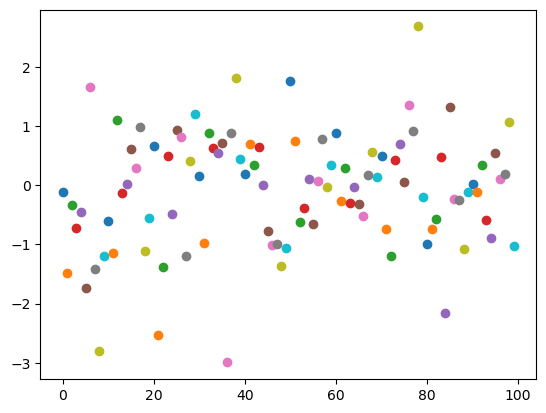

In [64]:
fig,ax=plt.subplots()
for i in range(100):
    ax.scatter(i,np.random.normal(loc=0.0, scale=1.0))

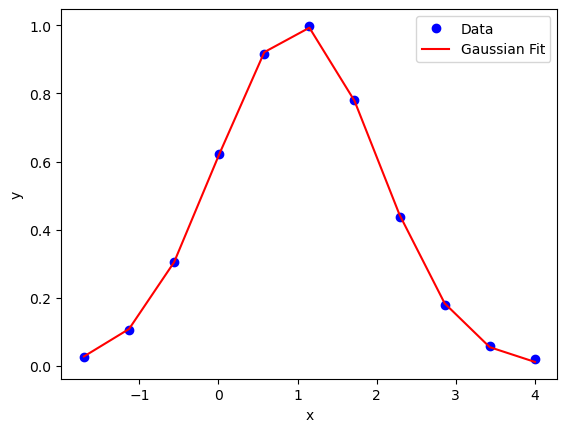

In [94]:
import numpy as np
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
from scipy import optimize
from scipy.optimize import curve_fit

# Set the parameters for the Gaussian profile
mu = 1.0
sigma_ = 1.0
sigma_list=np.linspace(1,1+1e-2,100)
mu_list=[]
A_list=[]
for sigma in np.linspace(1,1+1e-2,100):
    # Generate x-values
    x = np.linspace(-1.7, 4, 11)
    # Generate y-values using the Gaussian model
    gaussian_model = models.Gaussian1D(amplitude=1.0, mean=mu, stddev=stddev)
    y = gaussian_model(x)+0.01*np.random.random(size=np.shape(x))

    def func(x, A,mu):
        return A*np.exp(-(x-mu)**2/(2*sigma**2))


    # Perform the curve fitting
    initial_guess = [1, 1]  # Initial guess for the parameters
    params, params_covariance = curve_fit(func, x, y, p0=initial_guess)

    A_list.append(params[0])
    mu_list.append(params[1])
    
    
    # Print the fitted parameters
    # print('Fitted parameters:', params);


# Plot the generated points and the fitted Gaussian profile
plt.plot(x, y, 'bo', label='Data')
plt.plot(x, models.Gaussian1D(amplitude=params[0], mean=params[1], stddev=sigma)(x), 'r-', label='Gaussian Fit')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

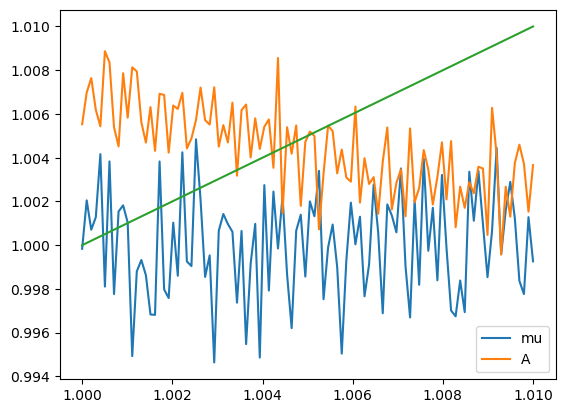

In [95]:
fig,ax=plt.subplots()
ax.plot(sigma_list,mu_list,label='mu')
ax.plot(sigma_list,A_list,label='A')
ax.plot(sigma_list,sigma_list)
ax.legend()

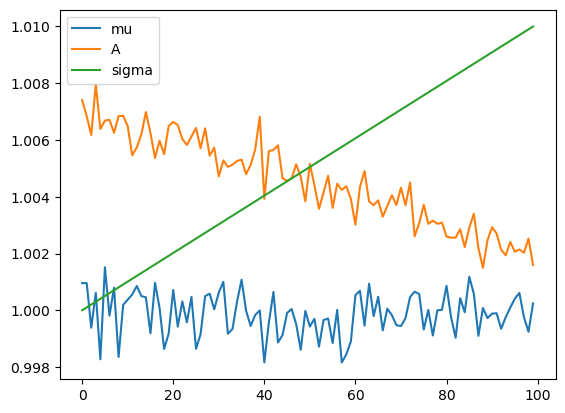

In [89]:
fig,ax=plt.subplots()
ax.plot(mu_list,label='mu')
ax.plot(A_list,label='A')
ax.plot(sigma_list,label='sigma')
ax.legend()

In [79]:
np.random.random(size=9)

array([0.73993748, 0.70466465, 0.96821177, 0.29530732, 0.70530677,
       0.36567633, 0.39541072, 0.23059464, 0.34401018])

In [57]:
np.random.normal(loc=0.0, scale=1.0)

1.2674116548186567

Fitted parameters: [1.06625992 0.94933878 0.92785199]


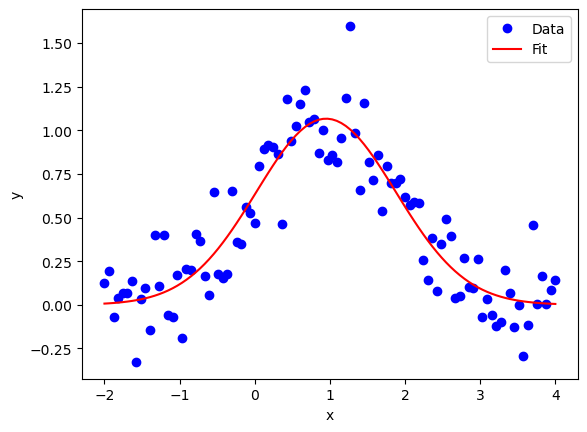

In [27]:
# Define the function you want to fit



# Generate some example data
x_data = np.linspace(-2, 4, 100)
y_data = func(x_data, 1, 1, 1) + np.random.normal(scale=0.2, size=100)

# Perform the curve fitting
initial_guess = [1, 1, 1]  # Initial guess for the parameters
params, params_covariance = curve_fit(func, x_data, y_data, p0=initial_guess)

# Print the fitted parameters
print('Fitted parameters:', params)

# Generate the fitted curve
x_fit = np.linspace(-2, 4, 100)
y_fit = func(x_fit, *params)

# Plot the data and the fitted curve
plt.plot(x_data, y_data, 'bo', label='Data')
plt.plot(x_fit, y_fit, 'r-', label='Fit')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

In [42]:
params

array([0.99501454, 1.        ])

## AIA

In [106]:
def select_files(start_date,end_date):
    # Directory containing the files
    directory = "aia_part/data/AIA_1p5"
    # Use glob to list all the files in the folder
    file_list = sorted(glob.glob(directory + '/*'))
    
    # List to store the files within the time range
    files_within_range = []
        # Specify the folder path

    # Iterate through all the files in the directory
    for filename in file_list:
        
        # Extract the date portion from the file name
        date_str = filename.split("_")[5]+filename.split("_")[6]+filename.split("_")[7].split('t')[0]  # Assuming the date is in the 5th position
        
        # Convert the date string to a datetime object
        file_date = datetime.datetime.strptime(date_str, "%Y%m%d")

        # Check if the file date is within the specified range
        if start_date <= file_date <= end_date:
            files_within_range.append(filename)
                                
    return files_within_range

In [107]:
def get_simu(start_date,end_date,a,b,c,d,e):
    selected_files=select_files(start_date,end_date)
    
    date_list = []
    mean_list=[]
    stddev_list=[]
    amplitude_list=[]


    for file in select_files(start_date,end_date):
        aia_adjusted_map=sunpy.map.Map(file)
        date,irradiance=calculate_DN(aia_adjusted_map,a=900,d=0.9,e=0)

        mean,stddev,amplitude=gaussian_fit_aia(wavelength_list_aia_absolute,irradiance)
        date_list.append(date)
        mean_list.append(mean)
        stddev_list.append(stddev)
        amplitude_list.append(amplitude)
        
        
        
    simu_data={
        'date':date_list,
        'mean':mean_list,
        'stddev':stddev_list,
        'amplitude':amplitude_list,
    }

    
    simu_df=pd.DataFrame(simu_data)
    simu_df=simu_df.set_index('date')
    return simu_df

In [108]:
def plotly_2d_aia(simu_df):
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

    # Add traces for mean
    fig.add_trace(go.Scatter(x=simu_df.index, y=simu_df['mean'],name='central wavelength'), 
                  row=3, col=1,)
    fig.update_yaxes(title_text="Mean", row=3, col=1) 

    # Add traces for stddev
    fig.add_trace(go.Scatter(x=simu_df.index, y=simu_df['stddev'])
                  , row=2, col=1)
    fig.update_yaxes(title_text="Standard Deviation", row=2, col=1)

    # Add traces for amplitude
    fig.add_trace(go.Scatter(x=simu_df.index, y=simu_df['amplitude'])
                  , row=1, col=1)
    fig.update_yaxes(title_text="Amplitude", row=1, col=1)





    # Update the figure layout
    fig.update_layout(width=600,height=1000,
                      title_text="Daily Mean, Standard Deviation, Amplitude and Irradiance")

    # Show the figure
    fig.show()

In [109]:
def plot_2d_aia(start_date,end_date,a,b,c,d,e):
    simu_df=get_simu(start_date,end_date,a,b,c,d,e)
    plotly_2d_aia(simu_df)

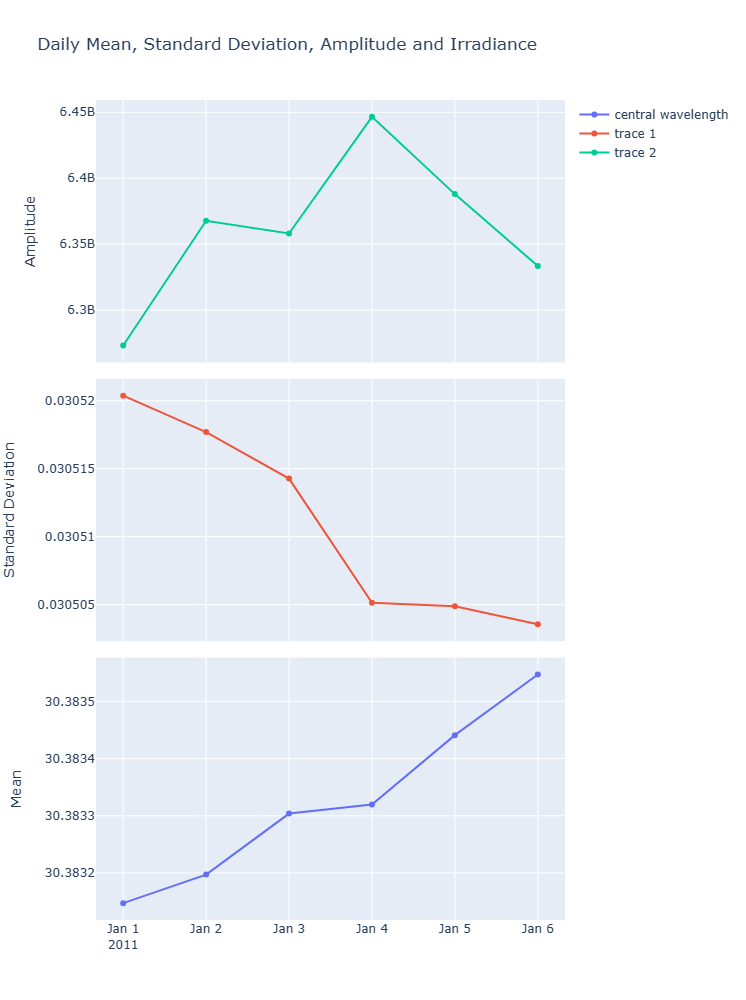

In [110]:
start_date = datetime.datetime(2011, 1, 1)
end_date = datetime.datetime(2011, 1, 6)
plot_2d_aia(start_date,end_date,a=900,b=0,c=0,d=.9,e=-0.015)

## combine

In [3]:
def select_df(start_date,end_date):
    daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
    daily_fit_df=daily_fit_df.set_index('time')
    daily_fit_df.index = pd.to_datetime(daily_fit_df.index)

    selected_df = daily_fit_df.loc[start_date:end_date]
    return selected_df

In [4]:
def select_files(start_date,end_date):
    # Directory containing the files
    directory = "aia_part/data/AIA_1p5"

    # List to store the files within the time range
    files_within_range = []

    # Iterate through all the files in the directory
    for filename in os.listdir(directory):
        # Extract the date portion from the file name
        date_str = filename.split("_")[3]+filename.split("_")[4]+filename.split("_")[5].split('t')[0]  # Assuming the date is in the 5th position

        # Convert the date string to a datetime object
        file_date = datetime.datetime.strptime(date_str, "%Y%m%d")

        # Check if the file date is within the specified range
        if start_date <= file_date <= end_date:
            files_within_range.append(
                os.path.join(directory,filename)
                                    )
    return files_within_range

def get_simu(start_date,end_date,a,b,c,d,e):
    selected_files=select_files(start_date,end_date)
    
    date_list =[] #pd.date_range(start=start_date, end=end_date,freq='D').tolist()
    mean_list=[]
    stddev_list=[]
    amplitude_list=[]


    for file in select_files(start_date,end_date):
        aia_adjusted_map=sunpy.map.Map(file)
        date,irradiance=calculate_DN(aia_adjusted_map,a,b,c,d,e)

        mean,stddev,amplitude=gaussian_fit_aia(wavelength_list_aia_absolute,irradiance)
        date_list.append(date)
        mean_list.append(mean)
        stddev_list.append(stddev)
        amplitude_list.append(amplitude)
        
        
        
    simu_data={
        'time':date_list,
        'mean':mean_list,
        'stddev':stddev_list,
        'amplitude':amplitude_list,
    }
#     print(len(date_list))
#     print(len(mean_list))
#     print(len(stddev_list))
#     print(len(amplitude_list))


#     print(date_list)
#     print(mean_list)
#     print(stddev_list)
#     print(amplitude_list)
    
    simu_df=pd.DataFrame(simu_data)
    simu_df=simu_df.set_index('time')
    return simu_df

In [5]:
def plotly_2d_combine(selected_df,simu_df,output_fig):
    # Create subplots with 3 rows and 1 column
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.01)

    # Add traces for stddev
    trace_stddev_eve=go.Scatter(x=selected_df.index, 
                             y=selected_df['median_of_stddev'],
                             name='EVE stddev',
                               line=dict(color='blue') ,)
    trace_stddev_aia=go.Scatter(x=simu_df.index, 
                             y=simu_df['stddev'],
                             name='AIA stddev',
                               line=dict(color='red') ,)
    
    fig.add_trace(trace_stddev_eve,row=1, col=1)
    fig.add_trace(trace_stddev_aia,row=1, col=1)
    fig.update_yaxes(title_text="Standard Deviation", row=1, col=1)
    
    # Add traces for amplitude
    trace_amplitude_eve=go.Scatter(x=selected_df.index, 
                             y=selected_df['median_of_amplitude']/np.nanmean(selected_df['median_of_amplitude']),
                             name='EVE amplitude',
                                  line=dict(color='blue') ,)
    trace_amplitude_aia=go.Scatter(x=simu_df.index, 
                             y=simu_df['amplitude']/np.nanmean(simu_df['amplitude']),
                             name='AIA amplitude',
                                  line=dict(color='red') ,)
    fig.add_trace(trace_amplitude_eve, row=2, col=1)
    fig.add_trace(trace_amplitude_aia, row=2, col=1)
    fig.update_yaxes(title_text="Relative amplitude", row=2, col=1)
    
    
    # Add traces for mean
    trace_mean_eve=go.Scatter(x=selected_df.index, 
                             y=selected_df['median_of_mean'],
                             name='EVE central wavelength',
                             line=dict(color='blue') ,)
    trace_mean_aia=go.Scatter(x=simu_df.index, 
                             y=simu_df['mean'],
                             name='AIA central wavelength',
                             line=dict(color='red') ,)
    fig.add_trace(trace_mean_eve,row=3, col=1,)
    fig.add_trace(trace_mean_aia,row=3, col=1,)
    fig.update_yaxes(title_text="Mean",row=3, col=1)
    fig.update_xaxes(title_text="Time", row=3, col=1)
    


    
    

    # Update the figure layout
    fig.update_layout(width=1200,height=1500,
                      title_text="Daily Median, Standard Deviation, Amplitude and Irradiance",
                     legend=dict(x=1, y=0.9)) 
    
    # Show the figure
    fig.show()
    if output_fig:
        fig.write_html(output_fig)

In [6]:
def plot_2d_combine(start_date,end_date,output_fig,a,b,c,d,e):
    selected_df=select_df(start_date,end_date)
    simu_df=get_simu(start_date,end_date,a,b,c,d,e)
    plotly_2d_combine(selected_df,simu_df,output_fig)

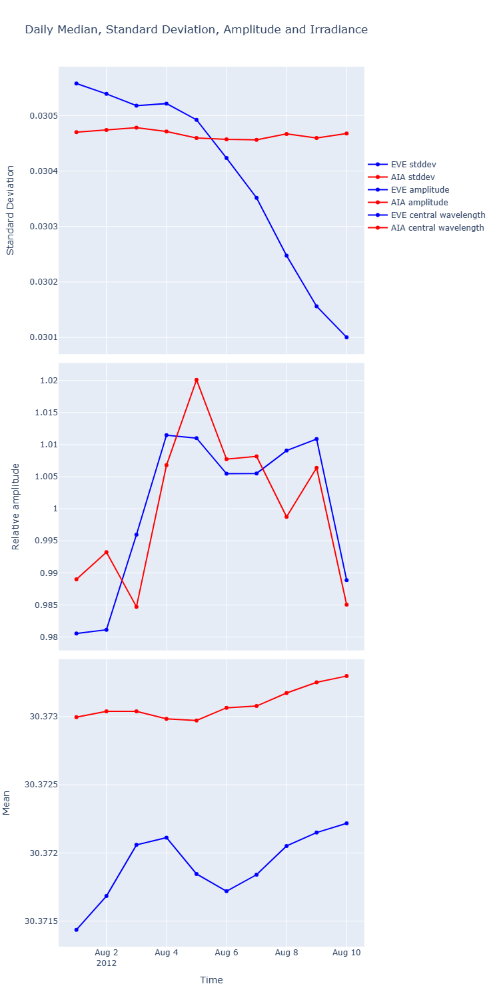

In [7]:
start_date = datetime.datetime(2012, 8, 1)
end_date = datetime.datetime(2012,8, 10)
# output_fig='P54.html'
output_fig=None
plot_2d_combine(start_date,end_date,output_fig,a=886,b=0,c=0,d=.91,e=-0.0097)

In [ ]:
a=886
b=0
c=0
d=.91
e=-0.0093
selected_df=select_df(start_date,end_date)
simu_df=get_simu(start_date,end_date,a,b,c,d,e)

In [33]:
for i in selected_df.index:
    if i not in simu_df.index:
        print(i)

NameError: name 'simu_df' is not defined

In [ ]:
simu_df.index

In [ ]:
selected_df.index

In [ ]:
importlib.reload(aia_part.gaussian_fit_aia )
from aia_part.gaussian_fit_aia import gaussian_fit_aia

## combine shadow

In [30]:
importlib.reload(aia_part.calculate_DN)
from aia_part.calculate_DN import calculate_DN

In [10]:
def select_df(start_date,end_date):
    daily_fit_df=pd.read_csv ('eve_part/data/daily_data.csv')
    daily_fit_df=daily_fit_df.set_index('time')
    daily_fit_df.index = pd.to_datetime(daily_fit_df.index)

    selected_df = daily_fit_df.loc[start_date:end_date]
    return selected_df

In [11]:
def select_files(start_date,end_date):
    # Directory containing the files
    directory = "aia_part/data/AIA_1p5"
    # Use glob to list all the files in the folder
    file_list = sorted(glob.glob(directory + '/*'))
    
    # List to store the files within the time range
    files_within_range = []
        # Specify the folder path

    # Iterate through all the files in the directory
    for filename in file_list:
        
        # Extract the date portion from the file name
        date_str = filename.split("_")[5]+filename.split("_")[6]+filename.split("_")[7].split('t')[0]  # Assuming the date is in the 5th position
        
        # Convert the date string to a datetime object
        file_date = datetime.datetime.strptime(date_str, "%Y%m%d")

        # Check if the file date is within the specified range
        if start_date <= file_date <= end_date:
            files_within_range.append(filename)
                                
    return files_within_range

def get_simu(start_date,end_date,a,b,c,d,e):
    selected_files=select_files(start_date,end_date)
    
    date_list =[] #pd.date_range(start=start_date, end=end_date,freq='D').tolist()
    mean_list=[]
    stddev_list=[]
    amplitude_list=[]


    for file in select_files(start_date,end_date):
        aia_adjusted_map=sunpy.map.Map(file)
        date,irradiance=calculate_DN(aia_adjusted_map,a,b,c,d,e)

        mean,stddev,amplitude=gaussian_fit_aia(wavelength_list_aia_absolute,irradiance)
        date_list.append(date)
        mean_list.append(mean)
        stddev_list.append(stddev)
        amplitude_list.append(amplitude)
        
        
        
    simu_data={
        'time':date_list,
        'mean':mean_list,
        'stddev':stddev_list,
        'amplitude':amplitude_list,
    }
    
    simu_df=pd.DataFrame(simu_data)
    simu_df=simu_df.set_index('time')
    return simu_df

In [12]:
def plotly_2d_combine(selected_df,simu_df,output_fig):
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.011)

    valid_day=np.where(selected_df['available_data']>=np.nanmean(selected_df['available_data'])*0.2,1,np.nan)
    x = selected_df.index
    y_median = selected_df['median_of_mean']*valid_day
    y_stddev = selected_df['stddev_of_mean']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])

    # EVE: Plot the mean line
    fig.add_trace(go.Scatter(x=x, y=y_median,
                                  # showlegend=False, 
                            line=dict(color='rgb(0,128,255)', ),
                            name='EVE') ,
                  row=3, col=1,)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                  fill='tozerox', 
                                  fillcolor='rgba(0,176,246,0.2)',
                                  line=dict(color='rgba(127,255,0,0.2)'),
                                  showlegend=False, 
                                  name='3 Std. Dev.'),
                 row=3, col=1)
    #AIA
    fig.add_trace(go.Scatter(x=simu_df.index, y=simu_df['mean'],
                              # showlegend=False, 
                        line=dict(color='rgb(255,128,53)'),
                                 name='AIA') ,
              row=3, col=1,)
    
    fig.update_yaxes(title_text="Mean (nm)",range=[30.3705, 30.3755],row=3, col=1)
    # Show the plot



    # Create a figure for stddev
    x = selected_df.index
    y_median = selected_df['median_of_stddev']*valid_day
    y_stddev = selected_df['stddev_of_stddev']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])

    fig.add_trace(go.Scatter(x=x, y=y_median,
                                showlegend=False,
                             line=dict(color='rgb(0,128,255)'),),
                          row=2, col=1)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                  fill='tozerox', 
                                  fillcolor='rgba(0,176,246,0.2)',
                                  line=dict(color='rgba(127,255,0,0.2)'),
                                  showlegend=False,
                                  name='3 Std. Dev.'),
                        row=2, col=1)
    #AIA
    fig.add_trace(go.Scatter(x=simu_df.index, y=simu_df['stddev'],
                              showlegend=False, 
                        line=dict(color='rgb(255,128,53)', )) ,
              row=2, col=1,)
    fig.update_yaxes(title_text="Stddev (nm)",range=[0.026, 0.032],row=2, col=1)





    # # Create a figure for amplitude
    x = selected_df.index
    y_median = selected_df['median_of_amplitude']*valid_day
    y_stddev = selected_df['stddev_of_amplitude']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])


    fig.add_trace(go.Scatter(x=selected_df.index, y=y_median/np.nanmean(y_median),
                                             showlegend=False,
                            line=dict(color='rgb(0,128,255)'),),
                             row=1, col=1)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y/np.nanmean(y_median), mode='lines', 
                                  fill='tozerox', 
                                  fillcolor='rgba(0,176,246,0.2)',
                                  line=dict(color='rgba(127,255,0,0.2)'),
                                  showlegend=False, 
                                  name='3 Std. Dev.'),
                           row=1, col=1)
    #AIA
    fig.add_trace(go.Scatter(x=simu_df.index, y=simu_df['amplitude']/np.nanmean(simu_df['amplitude']),
                              showlegend=False, 
                        line=dict(color='rgb(255,128,53)', )) ,
              row=1, col=1,)
    fig.update_yaxes(title_text='relative amplitude ',
                     # range=[0.6, 1.4],
                     row=1, col=1)



    # total fig adjustment
    fig.update_layout(width=1200,height=1500,
                          title_text=f"EVE AIA",
                         legend=dict(x=1, y=0.9)) 
    fig.update_xaxes(title_text="Time",row=3, col=1)

    #save & display
    if(output_fig):
        fig.write_html(output_fig)
    fig.show() 

In [13]:
def plot_2d_combine(start_date,end_date,output_fig,a,b,c,d,e):
    selected_df=select_df(start_date,end_date)
    simu_df=get_simu(start_date,end_date,a,b,c,d,e)
    plotly_2d_combine(selected_df,simu_df,output_fig)

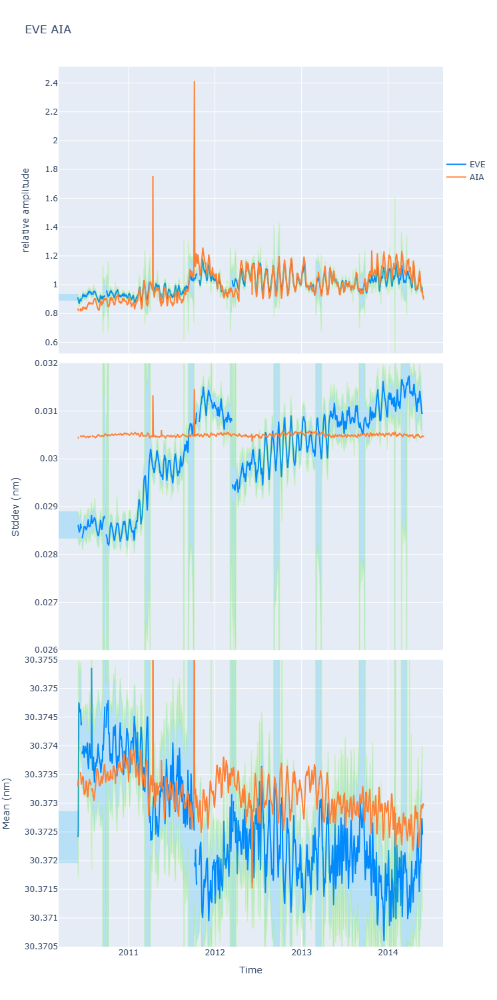

In [16]:
start_date = datetime.datetime(2010, 6, 1)
end_date = datetime.datetime(2014, 6, 1)

output_fig='P54.html'
# output_fig=None
plot_2d_combine(start_date,end_date,output_fig,a=886,b=0,c=0,d=.91,e=-0.0097)

### test

In [8]:
start_date = datetime.datetime(2011, 10, 27)
end_date = datetime.datetime(2011, 10, 28)

output_fig='P54.html'


a=886
b=0
c=0
d=.91
e=-0.0097

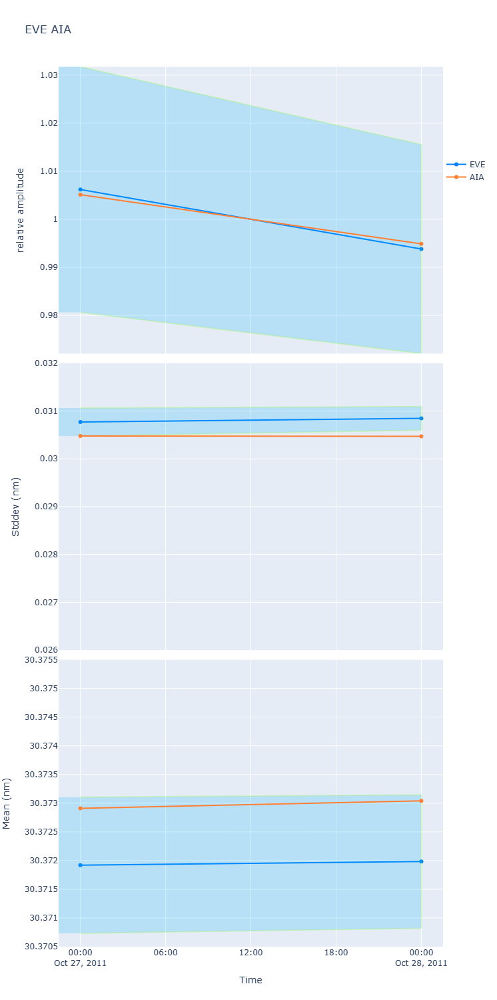

In [9]:
selected_df=select_df(start_date,end_date)
simu_df=get_simu(start_date,end_date,a,b,c,d,e)
plotly_2d_combine(selected_df,simu_df,output_fig)

In [11]:
selected_df

,median_of_mean,median_of_stddev,median_of_amplitude,stddev_of_mean,stddev_of_stddev,stddev_of_amplitude,available_data
time,,,,,,,
2011-10-27,30.371920,0.030771,0.007078,0.000395,0.000097,0.000060,8474
2011-10-28,30.371983,0.030848,0.006991,0.000387,0.000083,0.000051,8582


In [12]:
simu_df

,mean,stddev,amplitude
time,,,
2010-06-02,30.373334,0.030440,5.860252e+09
2011-10-28,30.373041,0.030472,7.773556e+09


In [13]:
temp=select_files(start_date,end_date)

In [14]:
temp

['aia_part/data/AIA_1p5\\aia_lev1_304a_2011_10_27t01_00_08_13z_image_lev1_adjusted.fits',
 'aia_part/data/AIA_1p5\\aia_lev1_304a_2011_10_28t00_00_08_12z_image_lev1_adjusted.fits']

In [15]:
smap=sunpy.map.Map(temp[0])

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2010-06-02 00:05:38
Exposure Time,1.0 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

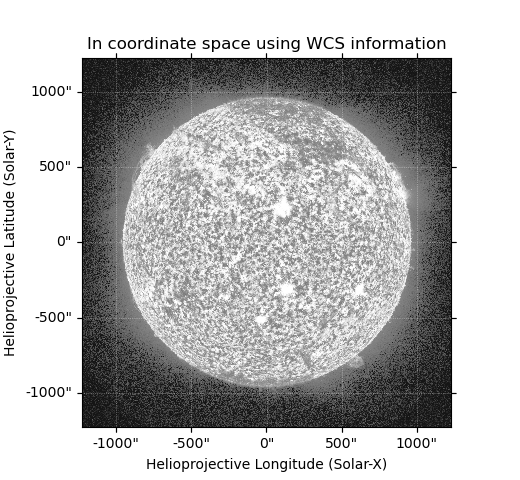
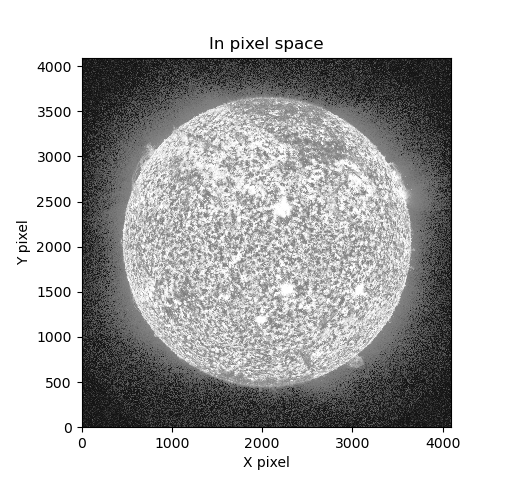
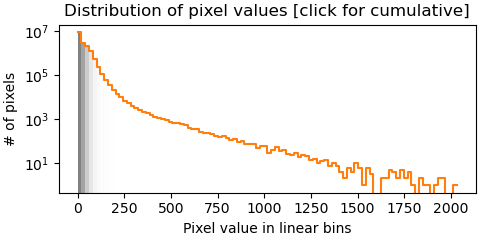
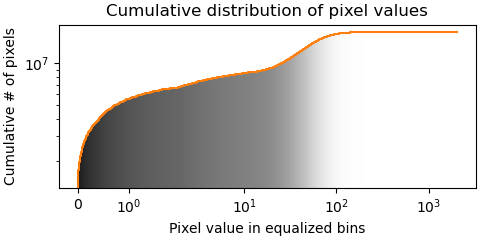

In [16]:
smap